In [1]:
import pandas as pd

In [2]:
covid_data = pd.read_csv('data/covid_data.csv')
covid_data.head(3)

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0


In [3]:
vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
        ['country', 'date', 'total_vaccinations', 
         'people_vaccinated', 'people_vaccinated_per_hundred',
         'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
         'daily_vaccinations', 'vaccines']
    ]

vaccinations_data.head(3)

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


In [4]:
covid_data = covid_data.groupby(
    ['date', 'country'],
    as_index=False
)[['confirmed', 'deaths', 'recovered']].sum()

covid_data.head(3)

,date,country,confirmed,deaths,recovered
0,01/01/2021,Afghanistan,51526.0,2191.0,41727.0
1,01/01/2021,Albania,58316.0,1181.0,33634.0
2,01/01/2021,Algeria,99897.0,2762.0,67395.0


In [5]:
covid_data['date'] = pd.to_datetime(covid_data['date'])

In [6]:
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']
covid_data.head(3)

,date,country,confirmed,deaths,recovered,active
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0,7608.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0,23501.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0,29740.0


In [7]:
covid_data = covid_data.sort_values(by=['country', 'date'])

covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()

covid_data.head(3)

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [8]:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])

In [9]:
covid_df = covid_data.merge(right=vaccinations_data, how='left', on=['date', 'country'])
covid_df.to_csv('data/covid_df.csv')

In [10]:
covid_df.head(3)

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
covid_df['death_rate'] = covid_df['deaths'] / covid_df['confirmed'] * 100
covid_df['recover_rate'] = covid_df['recovered'] / covid_df['confirmed'] * 100
covid_df.head(3)

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


Предобработка завершена

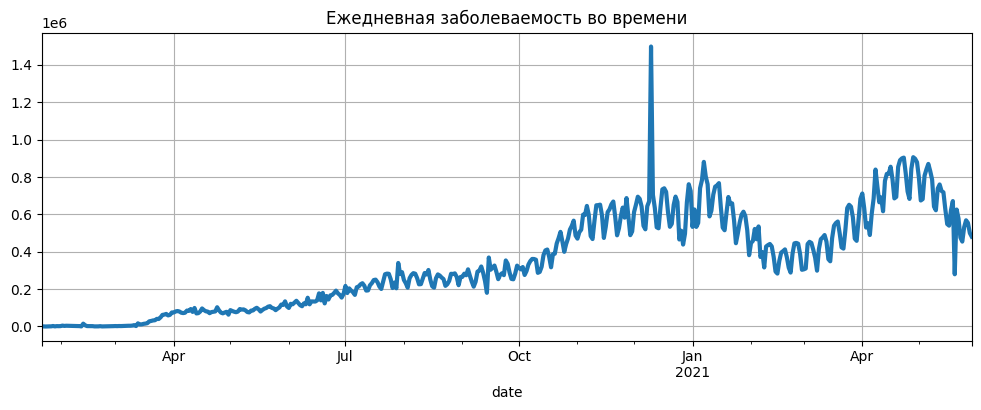

In [12]:
grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()

grouped_cases.plot(
    kind='line',
    figsize=(12, 4),
    title='Ежедневная заболеваемость во времени',
    grid=True,
    lw=3 #line width
);

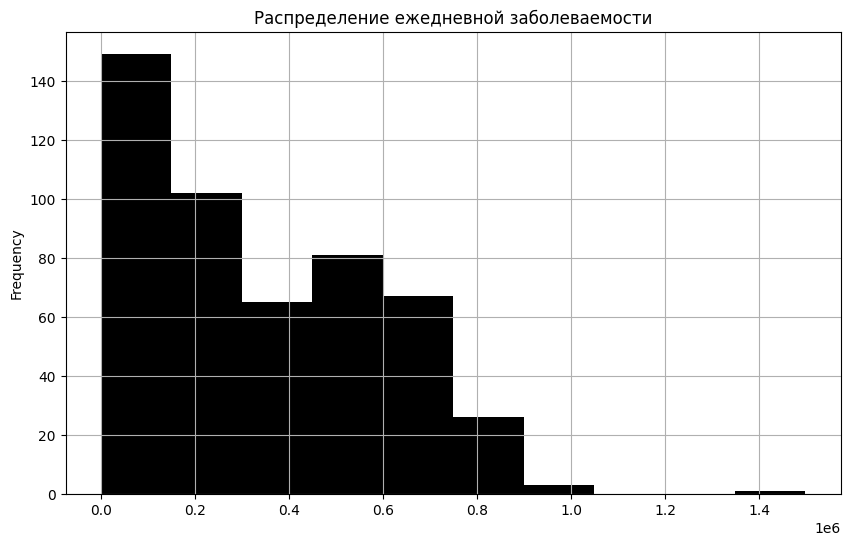

In [13]:
grouped_cases.plot(
    kind='hist',
    figsize=(10, 6),
    title='Распределение ежедневной заболеваемости',
    grid=True,
    color='black',
    bins=10
);

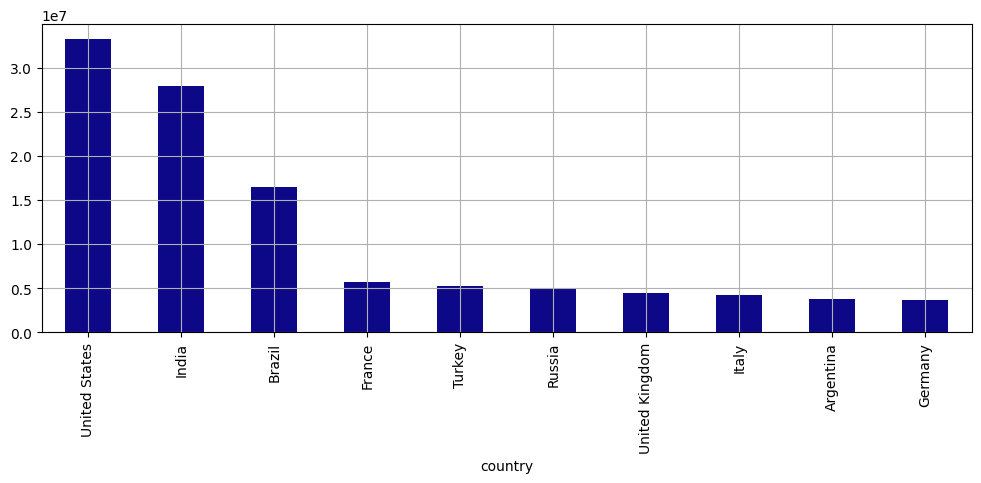

In [14]:
grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12, 4),
    colormap='plasma'
);

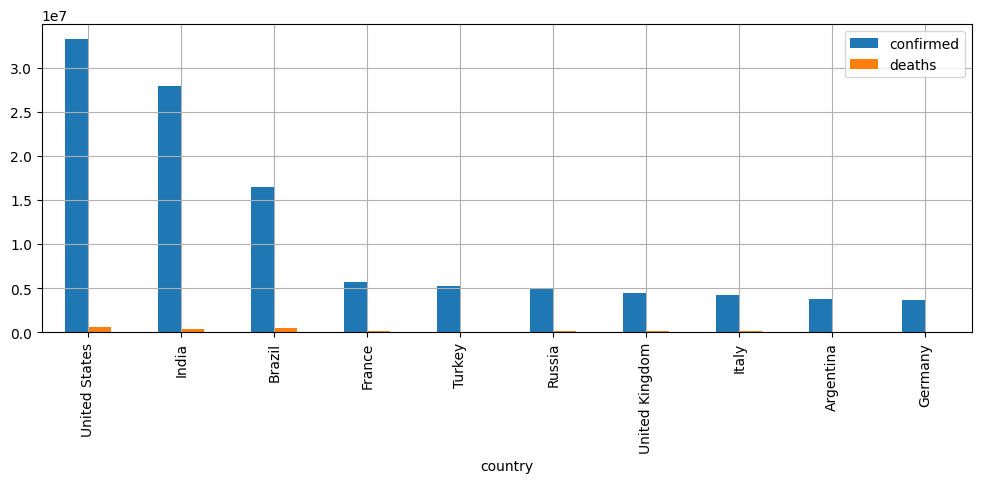

In [15]:
grouped_country = covid_df.groupby(['country'])[['confirmed', 'deaths']].last()

grouped_country = grouped_country.nlargest(10, columns=['confirmed'])

grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12, 4)
);

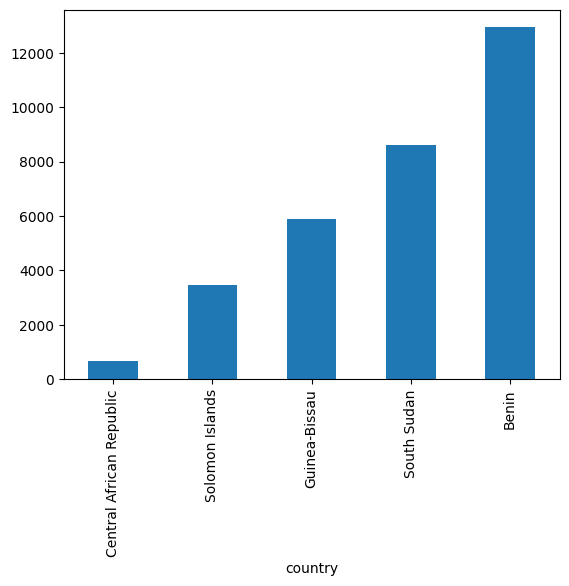

In [16]:
covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(5).plot(
    kind='bar'
    );

In [17]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default') # if using dark background

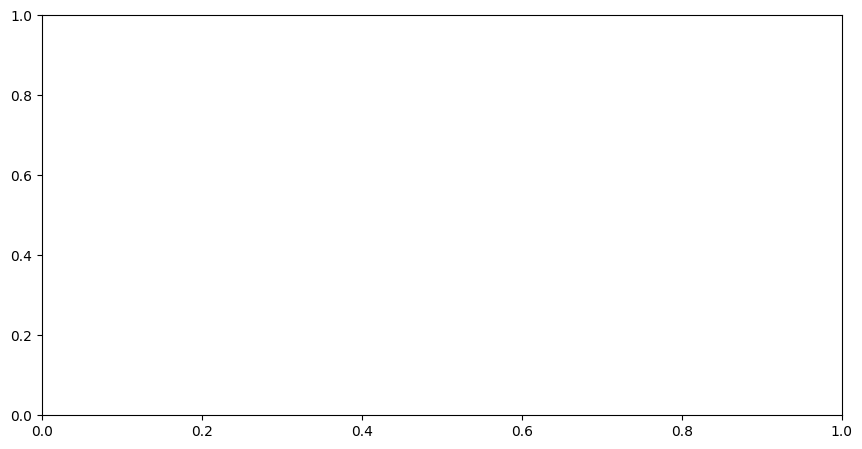

In [18]:
fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])

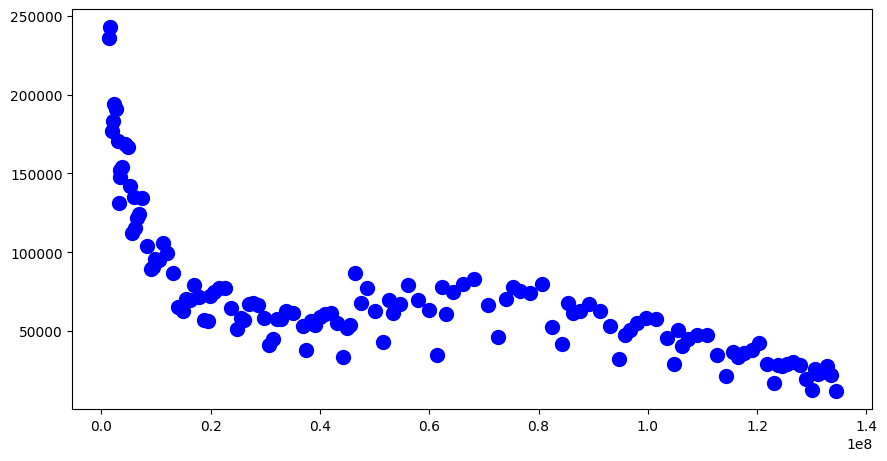

In [19]:
us_data = covid_df[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'],
    y=us_data['daily_confirmed'],
    s=100, #markers' size
    marker='o', #or '^'
    c='blue' #color
);

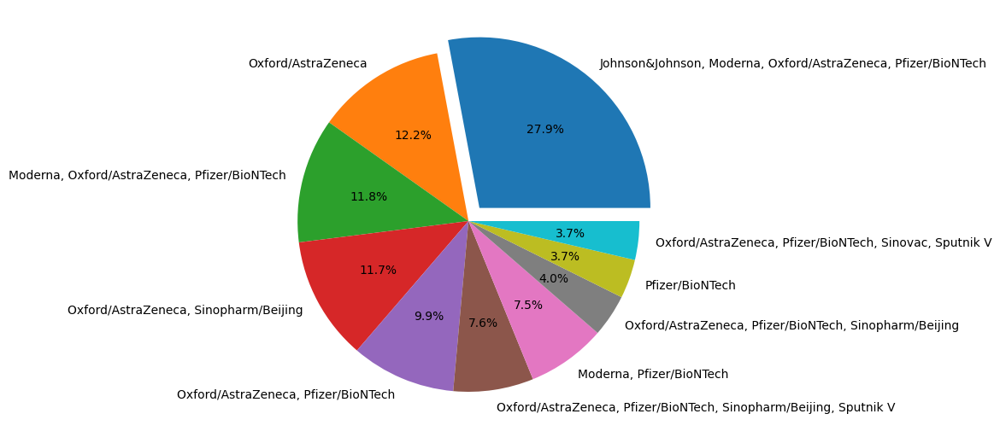

In [20]:
vaccine_combinations = covid_df['vaccines'].value_counts()[:10]

fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combinations,
    labels=vaccine_combinations.index,
    autopct='%.1f%%',
    explode = [0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
);

In [21]:
combination_not_nan = covid_df.dropna(subset=['vaccines'])
# delete rows, containing NaN in the 'subset' column

combinations_last = combination_not_nan.groupby(['country'])['vaccines'].last()

display(combinations_last)

country
Afghanistan    Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...
Albania        Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...
Algeria         Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V
Andorra                      Oxford/AstraZeneca, Pfizer/BioNTech
Angola                                        Oxford/AstraZeneca
                                     ...                        
Venezuela          Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V
Vietnam        Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, ...
Yemen                                         Oxford/AstraZeneca
Zambia                     Oxford/AstraZeneca, Sinopharm/Beijing
Zimbabwe       Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...
Name: vaccines, Length: 174, dtype: object

In [22]:
combinations_last = combinations_last.apply(lambda x: x.replace(' ', '').split(','))
display(combinations_last)

country
Afghanistan    [Johnson&Johnson, Oxford/AstraZeneca, Pfizer/B...
Albania        [Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac,...
Algeria        [Oxford/AstraZeneca, Sinopharm/Beijing, SputnikV]
Andorra                    [Oxford/AstraZeneca, Pfizer/BioNTech]
Angola                                      [Oxford/AstraZeneca]
                                     ...                        
Venezuela         [Sinopharm/Beijing, Sinopharm/Wuhan, SputnikV]
Vietnam        [Moderna, Oxford/AstraZeneca, Pfizer/BioNTech,...
Yemen                                       [Oxford/AstraZeneca]
Zambia                   [Oxford/AstraZeneca, Sinopharm/Beijing]
Zimbabwe       [Oxford/AstraZeneca, Sinopharm/Beijing, Sinova...
Name: vaccines, Length: 174, dtype: object

In [23]:
vaccines_dict = {}

for vaccines_list in combinations_last:
    for vaccine in vaccines_list:
        if vaccine not in vaccines_dict:
            vaccines_dict[vaccine] = 1
        else:
            vaccines_dict[vaccine] += 1

In [24]:
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)

vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]

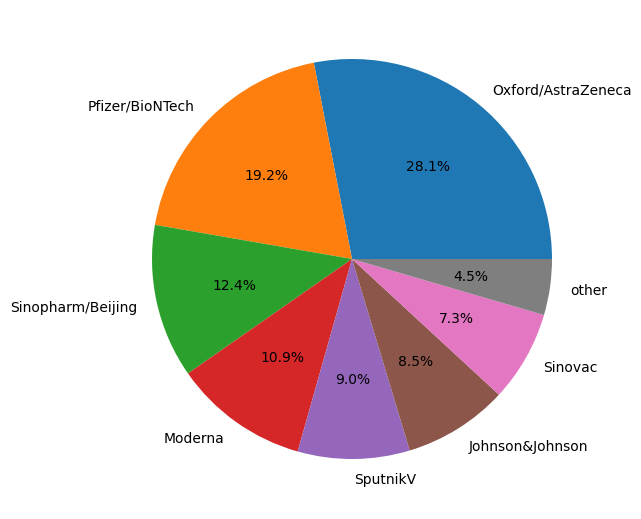

In [25]:
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%'
);

In [ ]:
# axes.set_title() — заголовок диаграммы, а также его настройки (например, параметр fontsize отвечает за размер шрифта);
# axes.set_xlabel() — название оси абсцисс;
# axes.set_ylabel() — название оси ординат;
# axes.set_xticks() — установка отметок на оси абсцисс;
# axes.set_yticks() — установка отметок на оси ординат;
# axes.xaxis.set_tick_params() — управление параметрами отметок на оси абсцисс (например, параметр rotation отвечает за поворот отметок в градусах);
# axes.yaxis.set_tick_params() — управление параметрами отметок на оси ординат;
# axes.legend() — отображение легенды;
# axes.grid() — установка сетки.

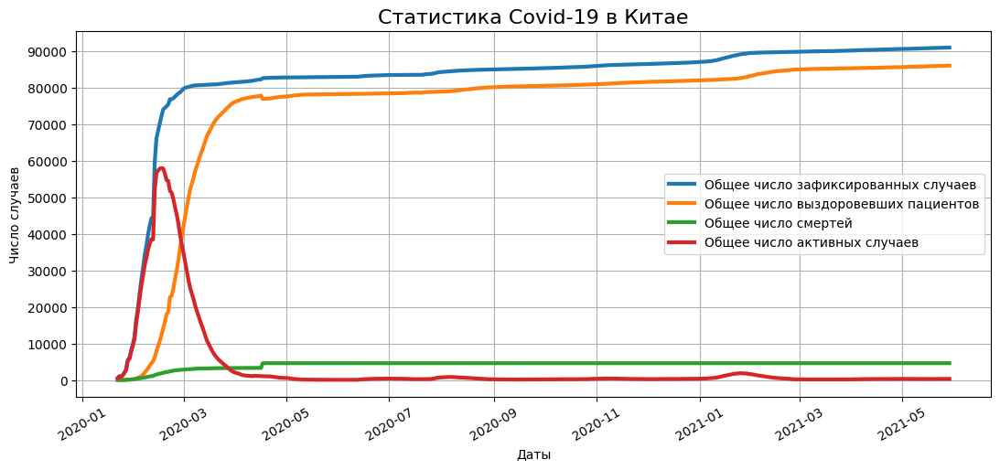

In [26]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()

fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])

axes.plot(china_grouped['confirmed'], label='Общее число зафиксированных случаев', lw=3)
axes.plot(china_grouped['recovered'], label='Общее число выздоровевших пациентов', lw=3)
axes.plot(china_grouped['deaths'], label='Общее число смертей', lw=3)
axes.plot(china_grouped['active'], label='Общее число активных случаев', lw=3)

axes.set_title('Статистика Covid-19 в Китае', fontsize=16)
axes.set_xlabel('Даты')
axes.set_ylabel('Число случаев')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

Использование нескольких систем координат

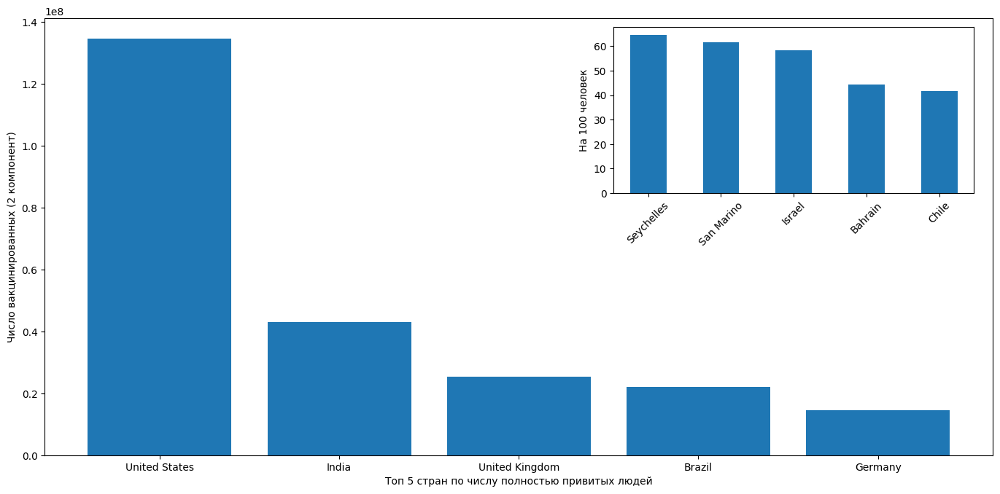

In [27]:
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundrer = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

fig = plt.figure(figsize=(13, 6))

# Main graph visualisation
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(
    x=vacc_country.index, 
    height = vacc_country
);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_xlabel('Топ 5 стран по числу полностью привитых людей')

# Additionary graph visualisation
insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(
    x=vacc_country_per_hundrer.index,
    height=vacc_country_per_hundrer,
    width=0.5
);
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

Subplots

Создание дополнительных систем координат

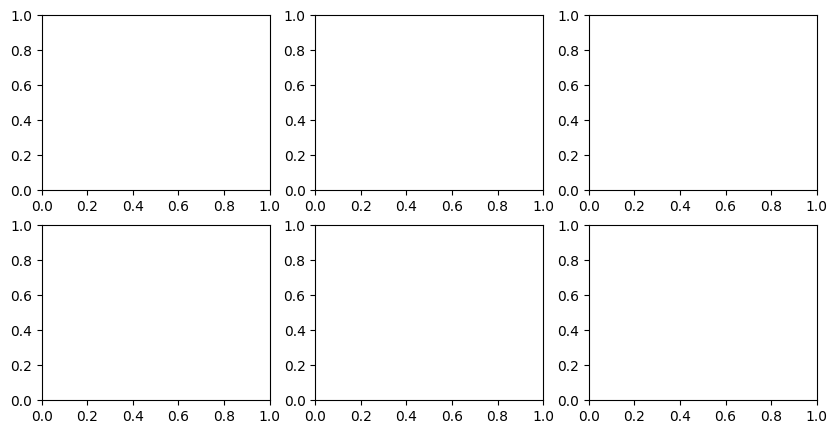

In [28]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))

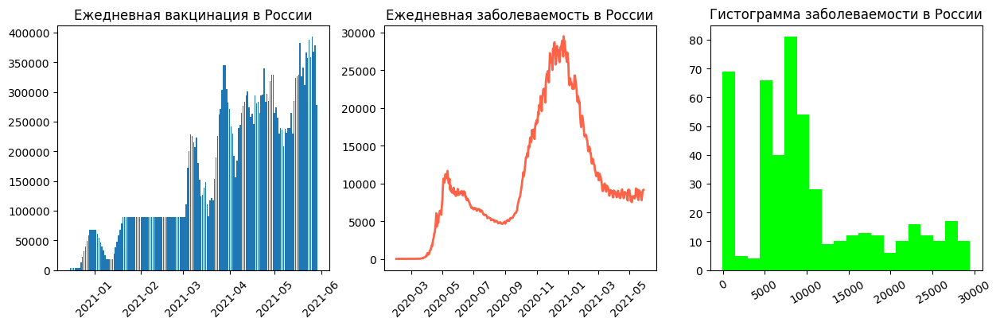

In [29]:
russia_data = covid_df[covid_df['country'] == 'Russia']

# Columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# Histogram
axes[0].bar( # Обращение к 1-й (0-й координатной плоскости) Graph #1
    x=russia_data['date'], # named
    height=russia_data['daily_vaccinations'],
    label='Число вакцинированных'   
)
axes[0].set_title('Ежедневная вакцинация в России')
axes[0].xaxis.set_tick_params(rotation=45)

# Linear graph
axes[1].plot(
    russia_data['date'], # ranked x
    russia_data['daily_confirmed'], # y
    label='Число заболевших',
    color='tomato',
    lw=2
)
axes[1].set_title('Ежедневная заболеваемость в России')
axes[1].xaxis.set_tick_params(rotation=45)

# Histogram
axes[2].hist(
    x=russia_data['daily_confirmed'],
    label=['Число заболевших'],
    color='lime',
    bins=20
)
axes[2].set_title('Гистограмма заболеваемости в России')
axes[2].xaxis.set_tick_params(rotation=30)

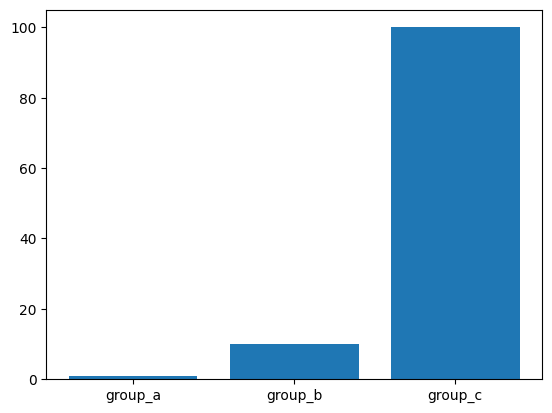

In [30]:
names = ['group_a', 'group_b', 'group_c']
values = [1, 10, 100]
plt.bar(names, values)
plt.show()

Seaborn

In [31]:
import seaborn as sns
print(sns.__version__)

0.13.2


.isin() - проверяет, есть ли запись в столбце, работает как маска

In [32]:
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)] #mask

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])

croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000


Histogram

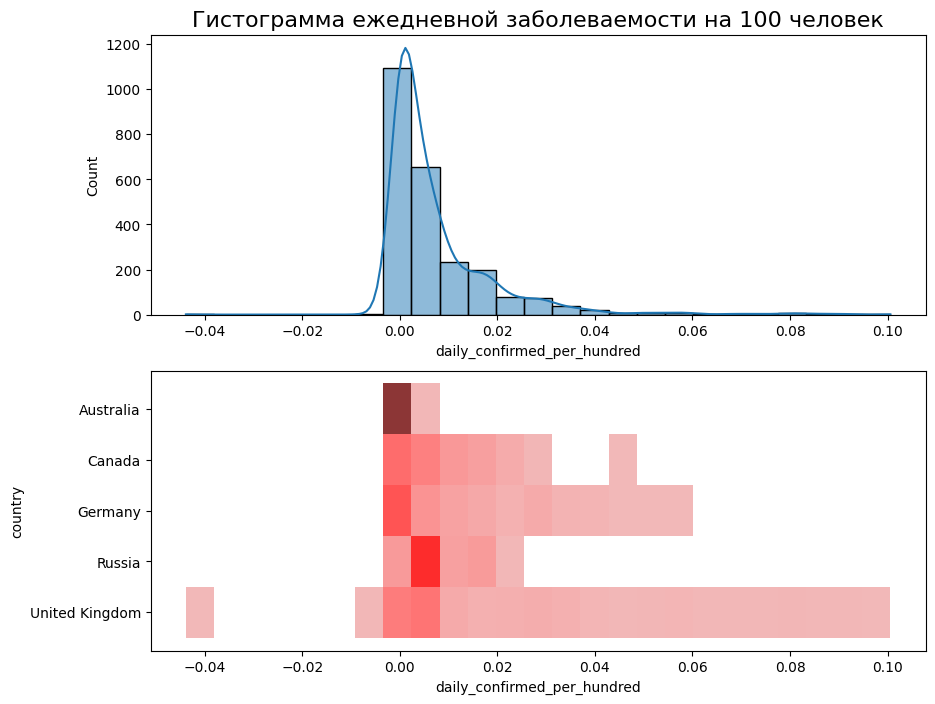

In [33]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)

sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);

Boxplot

C:\Users\chaff\AppData\Local\Temp\ipykernel_19468\2833974073.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


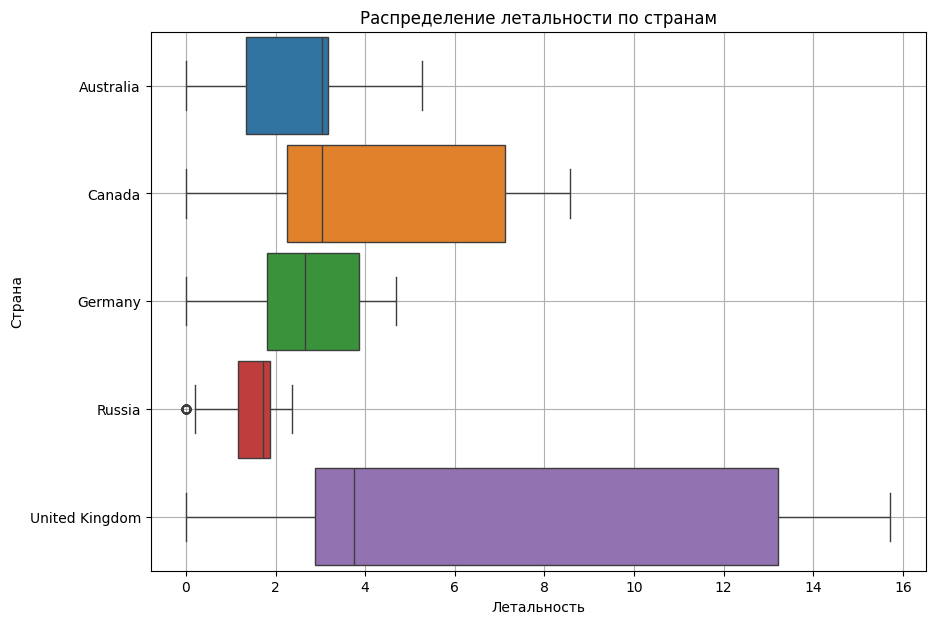

In [34]:
fig = plt.figure(figsize=(10, 7))

boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h', #horizontal orientation
    width=0.9,
    palette='tab10'
);
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()


Barplot

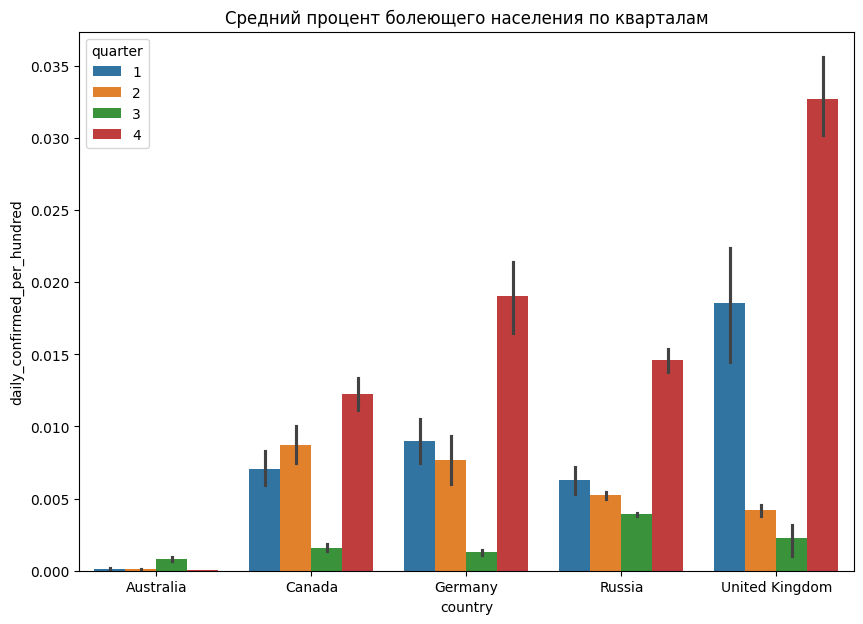

In [35]:
fig=plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
    palette='tab10'
)
barplot.set_title('Средний процент болеющего населения по кварталам');

Jointplot

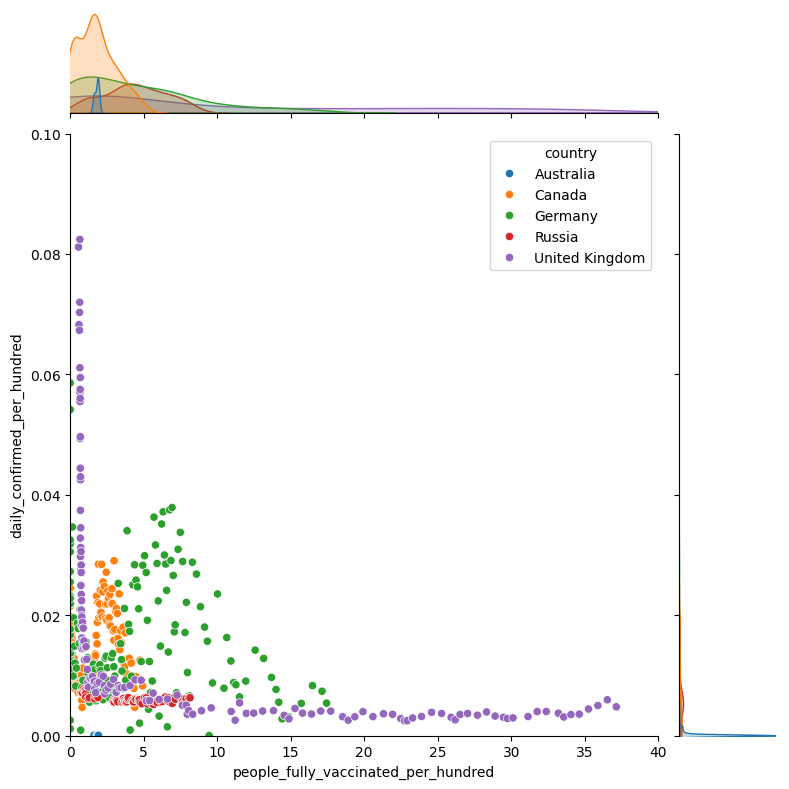

In [36]:
jointplot = sns.jointplot(
    data=croped_covid_df,
    x='people_fully_vaccinated_per_hundred',
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim=(0, 40), #diaposone
    ylim=(0, 0.1),
    height=8
)

Heatmap

In [37]:
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country'
)
pivot.columns = pivot.columns.astype('string') # making dates sting for the appropriate illustration

display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


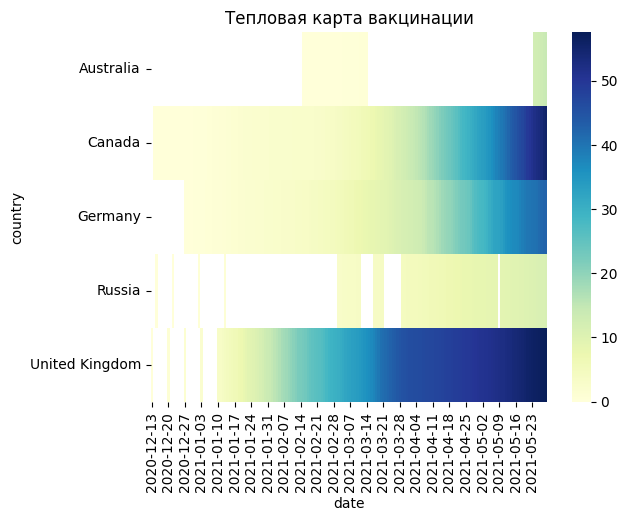

In [38]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu', annot=False) #cmap - color scheme, annot - legend
heatmap.set_title('Тепловая карта вакцинации', fontsize=12);

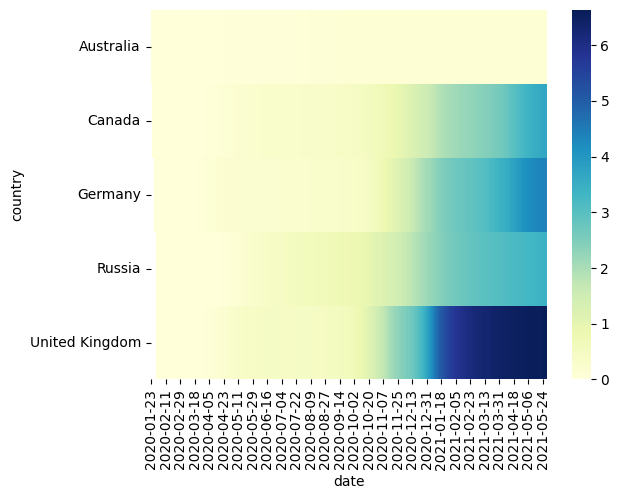

In [39]:
croped_covid_df['confirmed_per_hundred'] = croped_covid_df['confirmed'] / croped_covid_df['population'] * 100

pivot = croped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
pivot.columns = pivot.columns.astype('string')

heatmap = sns.heatmap(
    data=pivot,
    cmap='YlGnBu'
)

C:\Users\chaff\AppData\Local\Temp\ipykernel_19468\1437171318.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


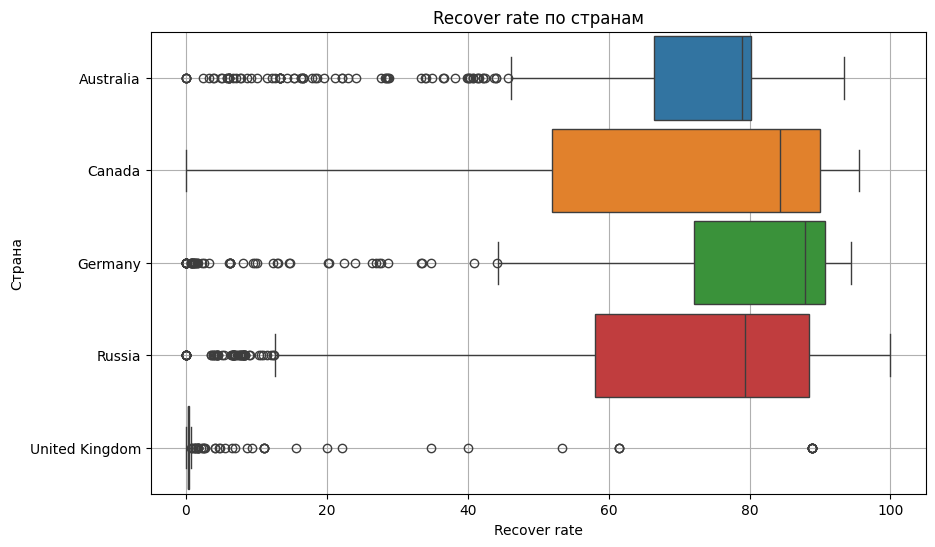

In [40]:
fig = plt.figure(figsize=(10, 6))

boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='recover_rate',
    orient = 'h',
    width=0.9,
    palette='tab10',
)

boxplot.set_title('Recover rate по странам')
boxplot.set_xlabel('Recover rate')
boxplot.set_ylabel('Страна')
boxplot.grid()


PLOTLY

In [41]:
import plotly
import plotly.express as px
print(plotly.__version__)

5.24.1


In [42]:
line_data=covid_df.groupby('date', as_index=False).sum()

fig = px.line(
    data_frame=line_data, #DataFrame
    x='date',
    y=['confirmed', 'deaths', 'recovered', 'active'],
    height=500,
    width=1000,
    title='Confirmed, Recovered, Deaths, Active cases over Time'
)
fig.show()

In [54]:
bar_data = covid_df.groupby(
    by='country', 
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(10, columns=['recover_rate'])

fig = px.bar(
    data_frame=bar_data,
    x='country',
    y='recover_rate',
    color='country', #расцветка в зависимости от страны
    text='recover_rate', #текст на столбцах
    orientation='v',
    height=500,
    width=1000,
    title='Top 10 Countries for Recovery Rate'
)

fig.show()

In [55]:
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

fig = px.treemap(
    data_frame=treemap_data,
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается, и от которого зависит размер квадрата
    height=500,
    width=1000,
    title='Daily Recovered Cases by Country'
)

fig.show()

In [58]:
choropleth_data = covid_df.sort_values(by='date')

choropleth_data['date'] = choropleth_data['date'].astype('string')

fig = px.choropleth(
    data_frame=choropleth_data,
    locations='country',
    locationmode='country names', #режим сопоставления локаций с базой Plotly
    color='confirmed', #от чего зависит цвет
    animation_frame='date', #анимационный бегунок
    range_color=[0, 10e6], #диапазон цвета
    title='Global Spread of COVID-19',
    width=1000,
    height=500,
    color_continuous_scale='Reds' #палитра цветов
)

fig.show()

In [60]:
countries = ['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']

scatter_data = covid_df[covid_df['country'].isin(countries)]

fig = px.scatter_3d(
    data_frame=scatter_data,
    x='daily_confirmed',
    y='daily_deaths',
    z='daily_vaccinations',
    color='country',
    log_x=True,
    log_y=True,
    width=1000,
    height=700 
)
fig.show()
fig.write_html('plotly/scatter_3d.html')

In [63]:
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']

box_data = covid_df[covid_df['country'].isin(countries)]

fig = px.box(
    data_frame=box_data, 
    x='daily_vaccinations', 
    color='country'
    )
fig.show()

In [77]:
task_data = covid_df.groupby('date', as_index=False)['daily_vaccinations'].sum()

fig = px.line(
    data_frame=task_data,
    x='date',
    y='daily_vaccinations',
)
fig.show()

In [85]:
task2_data = covid_df.sort_values(by='date')
task2_data['date'] = task2_data['date'].astype('string')

fig = px.choropleth(
    data_frame=task2_data,
    locations='country',
    locationmode='country names',
    color='total_vaccinations',
    hover_name='country',
    animation_frame='date',
    range_color=[0, 600e6]  
)
fig.show()